# **Human Action Recognition in videos using Keras (CNN+LSTM)**

# **Outlines**

*   step1: Download and visualize the data with its labels
*   step2: Preprocess the dataset
*   step3: Split the data into train and test set
*   step4: Implement convLSTM Approach
*         step4.1: Construct the model
*      step4.2: Compile and train the model
*      step4.3: Plot model's loss and accuracy curves
*  step5: Implement the LRCN model
*       step5.1: Construct the model
*      step5.2: Compile and train the model
*      step5.3: Plot model's loss and accuracy curves
*step6: Test the best Performing model on youtube video


**Import The Libraries**

In [1]:
!pip install pafy youtube-dl moviepy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 28.5 MB/s eta 0:00:00


In [2]:
!pip install --upgrade youtube-dl
!pip install --upgrade pafy
!pip install --upgrade pytube

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 3.2 MB/s eta 0:00:00


In [3]:
import os
import cv2
import pafy
import math
import random
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow as tf
from moviepy.editor import *
from collections import deque
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import EarlyStopping

**Seeds to get consistent results on every execution**

In [4]:
seed_constant = 27
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

# **Step1: Download and Visualize the data with its Labels**

In [5]:
!wget --no-check-certificate https://www.crcv.ucf.edu/data/UCF50.rar
!unrar x UCF50.rar

Streaming output truncated to the last 5000 lines.
Extracting  UCF50/HorseRace/v_HorseRace_g16_c03.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g16_c04.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g16_c05.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c01.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c02.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c03.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c04.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c05.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g18_c01.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g18_c02.avi                       23%  OK 
Extracting  UCF50/HorseRace/v

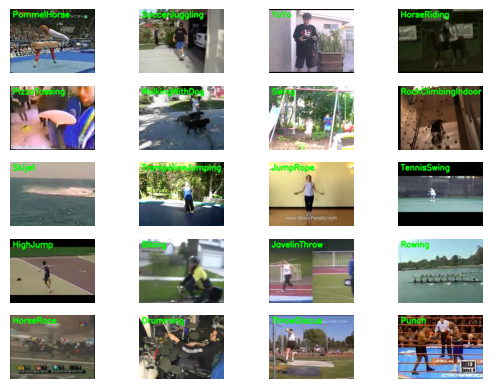

In [6]:
all_classes_names = os.listdir('UCF50')
random_range = random.sample(range(len(all_classes_names)), 20)
for counter, random_index in enumerate(random_range, 1):
  selected_class_Name = all_classes_names[random_index]
  video_files_names_path = 'UCF50/' + selected_class_Name
  selected_video_files_names = os.listdir(video_files_names_path)
  video_reader = cv2.VideoCapture(video_files_names_path + '/' + selected_video_files_names[0])
  _, bgr_frame = video_reader.read()
  video_reader.release
  rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)

  cv2.putText(rgb_frame, selected_class_Name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 255, 0), 3)
  plt.subplot(5, 4, counter)
  plt.imshow(rgb_frame)
  plt.axis('off')
plt.show()

# **Step2: Preprocess The Dataset**

In [7]:
IMAGE_HEIGHT, IMAGE_WIDTH = 64, 64
SEQUENCE_LENGTH = 20
DATASET_DIR = 'UCF50'
CLASSES_LIST = ['WalkingWithDog', 'TaiChi', 'Swing', 'HorseRace']

**Create a Function to extract, resize and normalize the frames**

In [8]:
def frames_extraction(video_path):
  frames_list=[]
  video_reader=cv2.VideoCapture(video_path)
  video_frames_count=int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
  skip_frames_window=max(int(video_frames_count/SEQUENCE_LENGTH),1)
  for frame_counter in range(SEQUENCE_LENGTH):
    video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
    success, frame = video_reader.read()
    if not success:
      break
    resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
    normalized_frame = resized_frame / 255
    frames_list.append(normalized_frame)
  video_reader.release()
  return frames_list

**Create a Function for dataset creation**

In [9]:
def create_dataset():
  features = []
  labels = []
  video_files_paths = []
  for class_index, class_name in enumerate(CLASSES_LIST):
    print("Extracting data of class: ", class_name)
    files_list = os.listdir(os.path.join(DATASET_DIR, class_name))
    for file_name in files_list:
      video_file_path = os.path.join(DATASET_DIR, class_name, file_name)
      frames = frames_extraction(video_file_path)
      if len(frames) == SEQUENCE_LENGTH:
        features.append(frames)
        labels.append(class_index)
        video_files_paths.append(video_file_path)
  features = np.asarray(features)
  labels = np.array(labels)
  return features, labels, video_files_paths

In [10]:
features, labels, video_files_paths = create_dataset()

Extracting data of class:  WalkingWithDog
Extracting data of class:  TaiChi
Extracting data of class:  Swing
Extracting data of class:  HorseRace


Convert labels into one hot encoder vectors

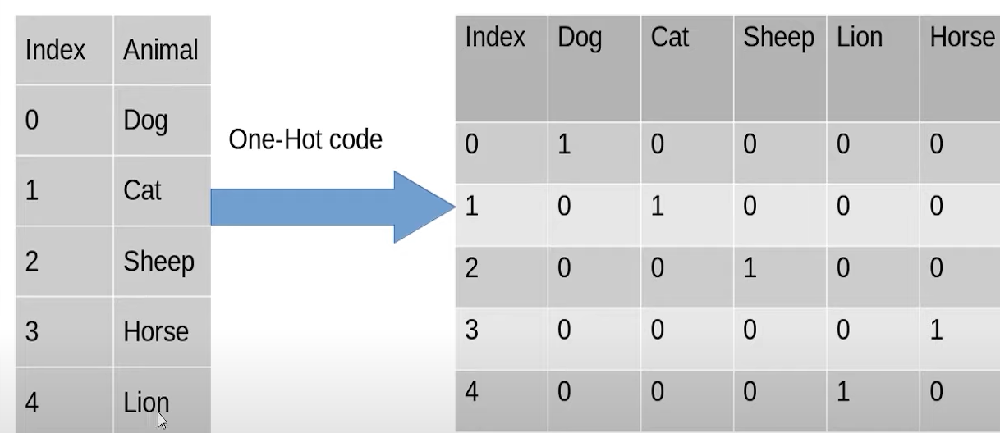

In [11]:
one_hot_encoded_labels = to_categorical(labels)

# **Step3: Split the Dataset into train and test set**

In [12]:
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.25, shuffle = True, random_state = seed_constant)

# **Step4: Implement the convLSTM Approach**

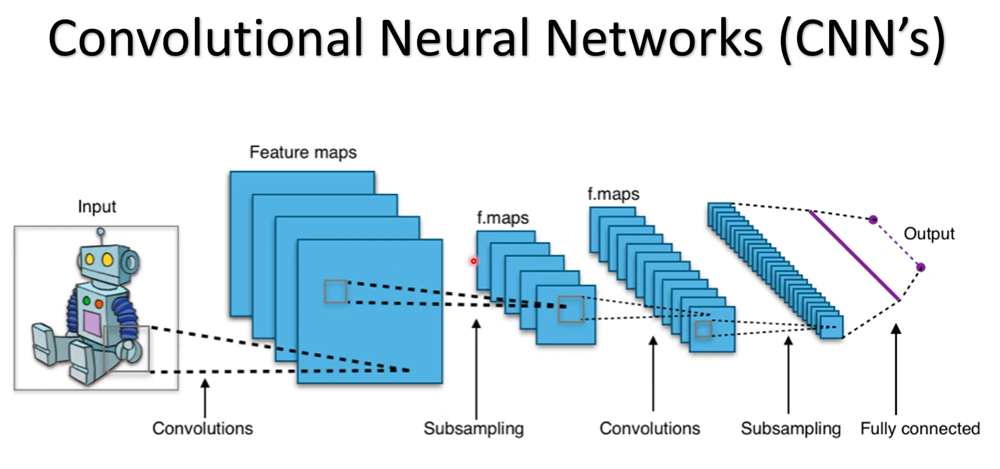

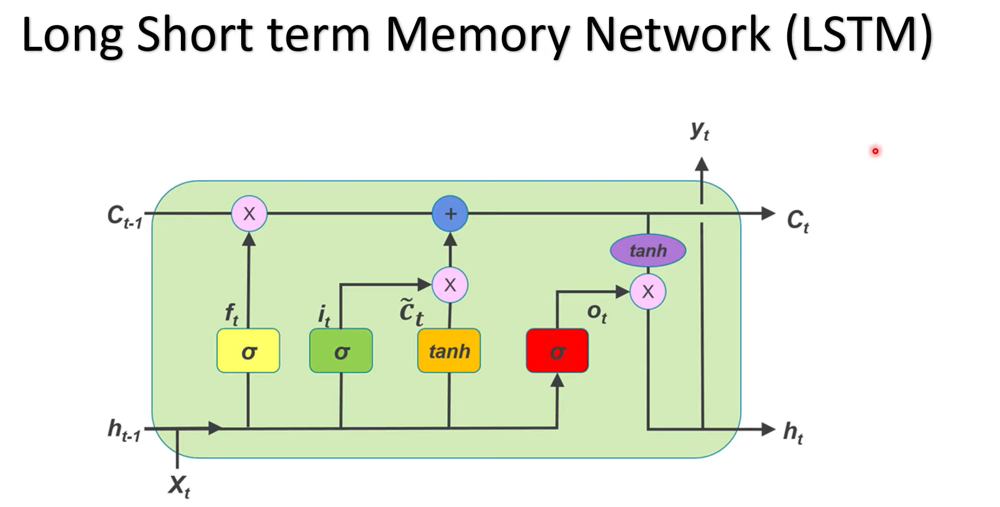

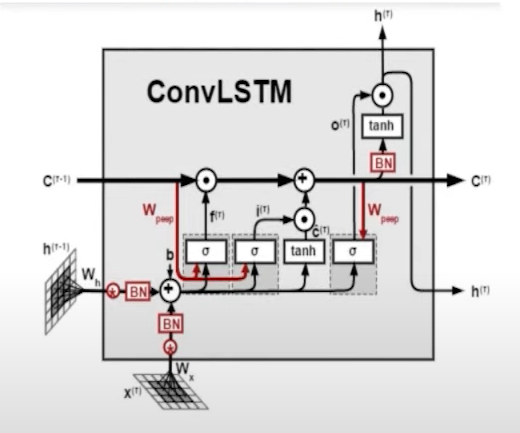

# **Step4.1: Construct The Model**

In [13]:
def create_conv_lstm_model():
  model = Sequential()
  model.add(ConvLSTM2D(filters = 4, kernel_size = (3, 3), activation = 'tanh', data_format='channels_last',
                       recurrent_dropout = 0.2, return_sequences=True, input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
  model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
  model.add(TimeDistributed(Dropout(0.2)))

  model.add(ConvLSTM2D(filters = 8, kernel_size = (3, 3), activation = 'tanh', data_format='channels_last',
                       recurrent_dropout = 0.2, return_sequences=True))
  model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
  model.add(TimeDistributed(Dropout(0.2)))

  model.add(ConvLSTM2D(filters = 14, kernel_size = (3, 3), activation = 'tanh', data_format='channels_last',
                       recurrent_dropout = 0.2, return_sequences=True, input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
  model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
  model.add(TimeDistributed(Dropout(0.2)))

  model.add(ConvLSTM2D(filters = 16, kernel_size = (3, 3), activation = 'tanh', data_format='channels_last',
                       recurrent_dropout = 0.2, return_sequences=True, input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
  model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
  # model.add(TimeDistributed(Dropout(0.2)))

  model.add(Flatten())
  model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))
  model.summary()
  return model

In [14]:
conv_lstm_model = create_conv_lstm_model()
print('model created successfully')

  super().__init__(**kwargs)



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv_lstm2d (ConvLSTM2D)             │ (None, 20, 62, 62, 4)       │           1,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d (MaxPooling3D)         │ (None, 20, 31, 31, 4)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 20, 31, 31, 4)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d_1 (ConvLSTM2D)           │ (None, 20, 29, 29, 8)       │           3,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_1 (MaxPooling3D)       │ (None, 20, 15, 15, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_1 (TimeDistributed) │ (None, 20, 15, 15, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d_2 (ConvLSTM2D)           │ (None, 20, 13, 13, 14)      │          11,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_2 (MaxPooling3D)       │ (None, 20, 7, 7, 14)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_2 (TimeDistributed) │ (None, 20, 7, 7, 14)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d_3 (ConvLSTM2D)           │ (None, 20, 5, 5, 16)        │          17,344 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_3 (MaxPooling3D)       │ (None, 20, 3, 3, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 2880)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 4)                   │          11,524 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 44,524 (173.92 KB)

 Trainable params: 44,524 (173.92 KB)

 Non-trainable params: 0 (0.00 B)

model created successfully


**Check Model's Structure**

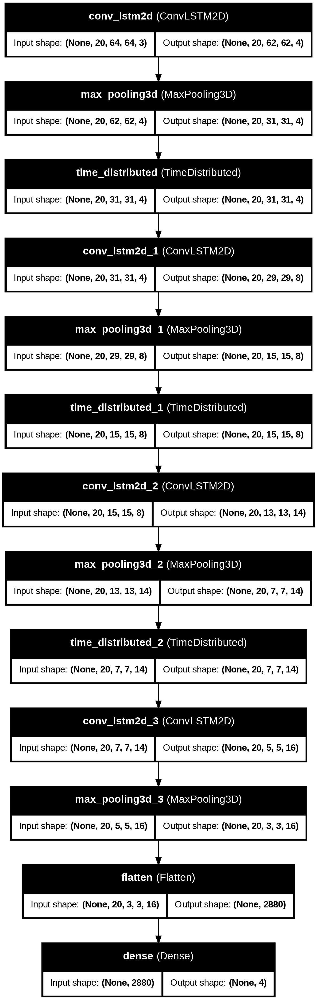

In [15]:
plot_model(conv_lstm_model, to_file = 'conv_lstm_model_structure_plot.png', show_shapes = True, show_layer_names = True)

# **Step4.2: Compile and Train The Model**

In [16]:
EarlyStopping_callback = EarlyStopping(monitor = 'val_loss', patience =10, mode = 'min', restore_best_weights = True)
conv_lstm_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])
convlstm_model_training_history = conv_lstm_model.fit(x = features_train, y = labels_train, epochs = 50, batch_size = 4,
                                                      shuffle = True, validation_split = 0.2, callbacks = [EarlyStopping_callback])

Epoch 1/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 63s 115ms/step - accuracy: 0.2637 - loss: 1.3848 - val_accuracy: 0.3562 - val_loss: 1.3595
Epoch 2/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - accuracy: 0.4019 - loss: 1.3270 - val_accuracy: 0.5342 - val_loss: 1.2191
Epoch 3/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.4932 - loss: 1.0870 - val_accuracy: 0.6301 - val_loss: 0.9192
Epoch 4/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.5674 - loss: 0.9458 - val_accuracy: 0.6712 - val_loss: 0.7964
Epoch 5/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.7463 - loss: 0.6907 - val_accuracy: 0.6712 - val_loss: 0.8354
Epoch 6/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.7907 - loss: 0.5177 - val_accuracy: 0.7260 - val_loss: 0.8023
Epoch 7/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.8391 - loss: 0.4215 - val_accuracy: 0.6575 - val_loss: 0.9138
Epoch 8/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - accuracy: 0.8805 - loss: 0.2763 - val_accuracy: 0.6301 

**Evaluate The Trained Model**

In [17]:
model_evaluation_history = conv_lstm_model.evaluate(features_test, labels_test)

4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 735ms/step - accuracy: 0.7553 - loss: 0.5890


**Save The Model**

In [18]:
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history
date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)

model_file_name = f'Conv_LSTM_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'
conv_lstm_model.save(model_file_name)

# **Step4.3: Plot Model's Loss and Acurracy curves**

In [19]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
  metric_value_1 = model_training_history.history[metric_name_1]
  metric_value_2 = model_training_history.history[metric_name_2]
  epochs = range(len(metric_value_1))
  plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
  plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)
  plt.title(str(plot_name))
  plt.legend()

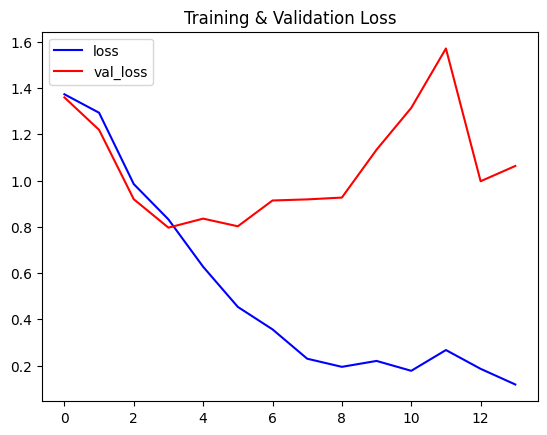

In [20]:
plot_metric(convlstm_model_training_history, 'loss', 'val_loss', 'Training & Validation Loss')

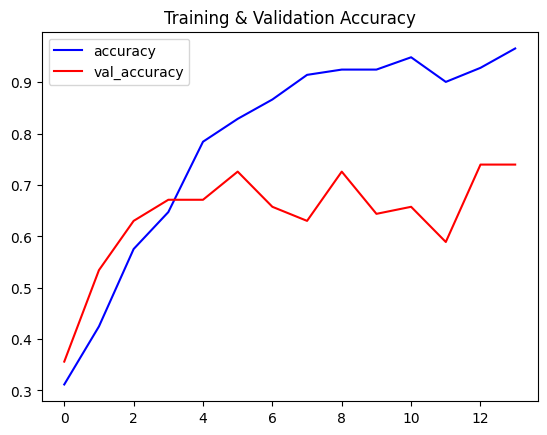

In [21]:
plot_metric(convlstm_model_training_history, 'accuracy', 'val_accuracy', 'Training & Validation Accuracy')

# **Step5: Implement The LRCN Approach**

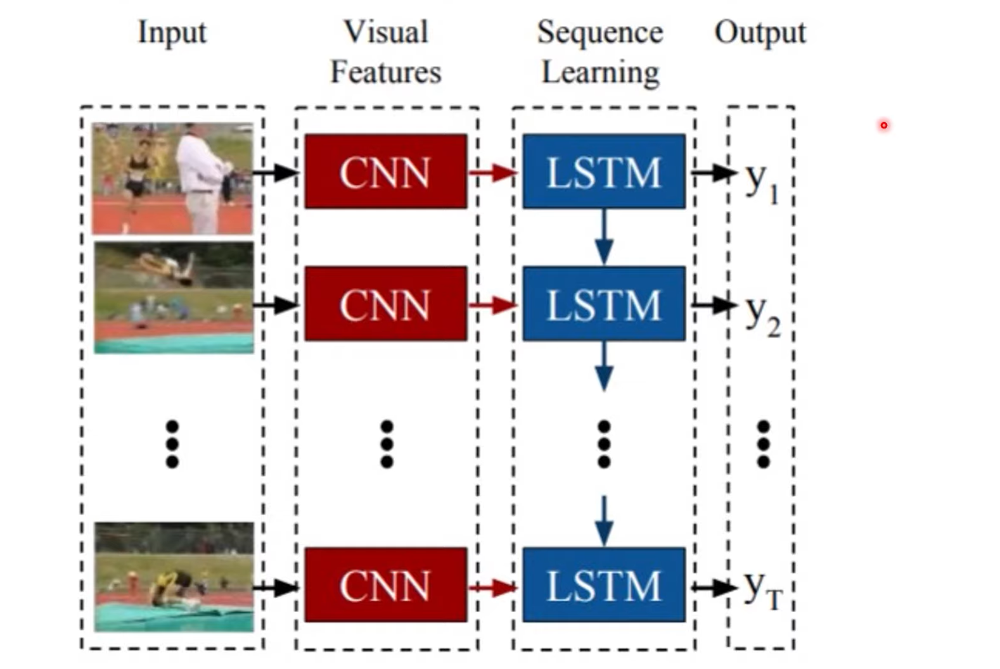

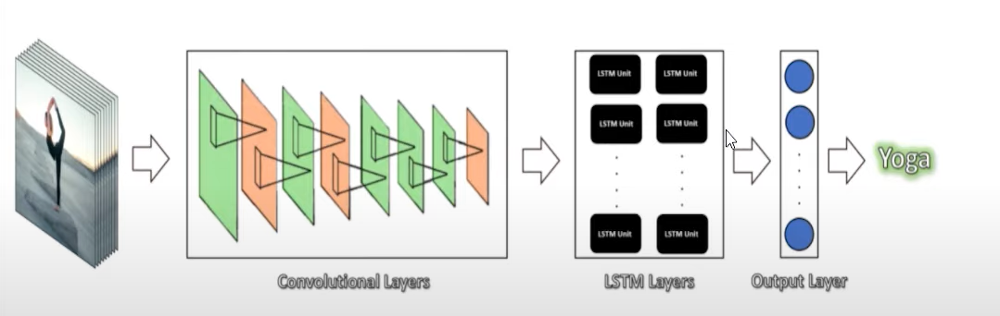

# **Step5.1: Construct The Model**

In [22]:
def create_LRCN_model():
  model = Sequential()
  model.add(TimeDistributed(Conv2D(16, (3, 3), padding='same',activation = 'relu'),
                          input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
  model.add(TimeDistributed(MaxPooling2D((4, 4))))
  model.add(TimeDistributed(Dropout(0.25)))

  model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same',activation = 'relu')))
  model.add(TimeDistributed(MaxPooling2D((4, 4))))
  model.add(TimeDistributed(Dropout(0.25)))

  model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
  model.add(TimeDistributed(MaxPooling2D((2, 2))))
  model.add(TimeDistributed(Dropout(0.25)))

  model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
  model.add(TimeDistributed(MaxPooling2D((2, 2))))

  model.add(TimeDistributed(Flatten()))

  model.add(LSTM(32))

  model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))
  model.summary()
  return model

In [23]:
LRCN_model = create_LRCN_model()
print('model created successfully')

  super().__init__(**kwargs)



Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ time_distributed_3 (TimeDistributed) │ (None, 20, 64, 64, 16)      │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_4 (TimeDistributed) │ (None, 20, 16, 16, 16)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_5 (TimeDistributed) │ (None, 20, 16, 16, 16)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_6 (TimeDistributed) │ (None, 20, 16, 16, 32)      │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_7 (TimeDistributed) │ (None, 20, 4, 4, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_8 (TimeDistributed) │ (None, 20, 4, 4, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_9 (TimeDistributed) │ (None, 20, 4, 4, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_10                  │ (None, 20, 2, 2, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_11                  │ (None, 20, 2, 2, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_12                  │ (None, 20, 2, 2, 64)        │          36,928 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_13                  │ (None, 20, 1, 1, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_14                  │ (None, 20, 64)              │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 32)                  │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 4)                   │             132 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 73,060 (285.39 KB)

 Trainable params: 73,060 (285.39 KB)

 Non-trainable params: 0 (0.00 B)

model created successfully


**Check Model's Structure**

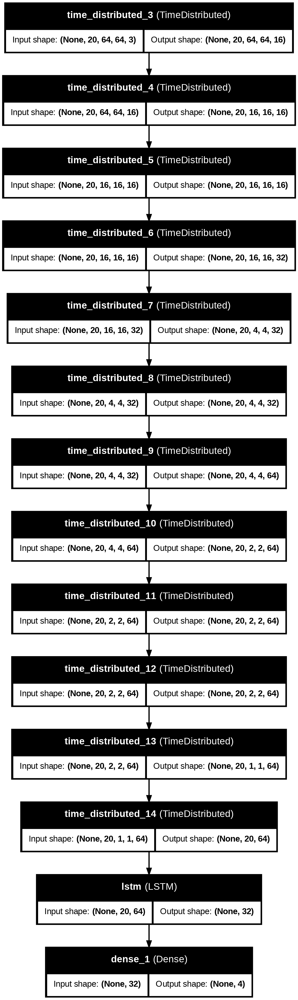

In [24]:
plot_model(LRCN_model, to_file="LCRN_model_structure_plot.png", show_shapes=True, show_layer_names=True)

# **Step5.2: Compile and Train the model**

In [25]:
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = 'min', restore_best_weights=True)
LRCN_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])
LRCN_model_training_history = LRCN_model.fit(x = features_train, y = labels_train, epochs = 70, batch_size = 4,
                                              shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])

Epoch 1/70
73/73 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - accuracy: 0.2809 - loss: 1.4067 - val_accuracy: 0.3562 - val_loss: 1.3470
Epoch 2/70
73/73 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.3420 - loss: 1.3561 - val_accuracy: 0.4384 - val_loss: 1.3477
Epoch 3/70
73/73 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.4811 - loss: 1.2797 - val_accuracy: 0.5068 - val_loss: 1.1557
Epoch 4/70
73/73 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.5447 - loss: 1.0826 - val_accuracy: 0.6849 - val_loss: 0.9576
Epoch 5/70
73/73 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.6858 - loss: 0.8127 - val_accuracy: 0.5616 - val_loss: 1.1314
Epoch 6/70
73/73 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.6752 - loss: 0.7497 - val_accuracy: 0.6438 - val_loss: 0.8746
Epoch 7/70
73/73 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7819 - loss: 0.5468 - val_accuracy: 0.6301 - val_loss: 0.8781
Epoch 8/70
73/73 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.8149 - loss: 0.4895 - val_accuracy: 0.5753 - 

**Evaluate the trained model**

In [26]:
model_evaluation_history = LRCN_model.evaluate(features_test, labels_test)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.8840 - loss: 0.4233


**Save the model**

In [27]:
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history
date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)

model_file_name = f'LRCN_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'
LRCN_model.save(model_file_name)

# **Step5.3: Plot Model's Loss and accuracy Curves**

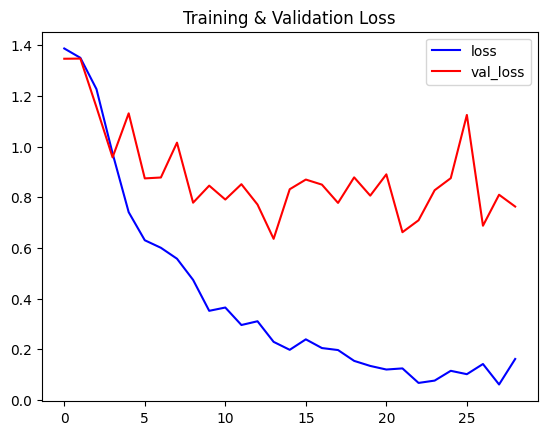

In [28]:
plot_metric(LRCN_model_training_history, 'loss', 'val_loss', 'Training & Validation Loss')

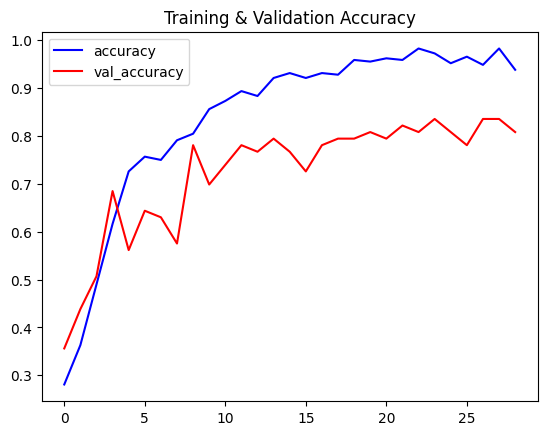

In [29]:
plot_metric(LRCN_model_training_history, 'accuracy', 'val_accuracy', 'Training & Validation Accuracy')

# **Step6: Test the best performing model on videos**

In [32]:
test_video_directory = 'test_videos'
os.makedirs(test_video_directory, exist_ok=True)
video_title = 'Test Video'
input_video_file_path = f'{test_video_directory}/{video_title}.mp4'

**Create a function to perform action recognition on the videos**

In [33]:
def predict_on_video(video_file_path, output_file_path, SEQUENCE_LENGTH):
  video_reader = cv2.VideoCapture(video_file_path)
  original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
  original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
  video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'),
                               video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))
  frames_queue = deque(maxlen = SEQUENCE_LENGTH)
  predicted_class_name = ''
  while video_reader.isOpened():
    ok, frame = video_reader.read()
    if not ok:
      break

    resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
    normalized_frame = resized_frame / 255
    frames_queue.append(normalized_frame)
    if len(frames_queue) == SEQUENCE_LENGTH:
      predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_queue, axis = 0))[0]
      predicted_label = np.argmax(predicted_labels_probabilities)
      predicted_class_name = CLASSES_LIST[predicted_label]
    cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
    video_writer.write(frame)

  video_reader.release()
  video_writer.release()

**Perform Action Recognition on the test video**

In [35]:
output_video_file_path = f'{test_video_directory}/{video_title}-Output-SegLen{SEQUENCE_LENGTH}.mp4'
predict_on_video(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)
VideoFileClip(output_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━

t:  97%|█████████▋| 844/867 [00:02<00:00, 405.09it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file test_videos/Test Video-Output-SegLen20.mp4, 360000 bytes wanted but 0 bytes read,at frame 866/867, at time 31.04/31.04 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready __temp__.mp4
